In [1]:
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Conv2D, ZeroPadding2D, Activation, Input, concatenate
from keras.models import Model

from keras.layers.normalization import BatchNormalization
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import Concatenate
from keras.layers.core import Lambda, Flatten, Dense

from keras.initializers import glorot_uniform
from keras.initializers import RandomNormal
from keras.engine.topology import Layer
from keras.regularizers import l2
from keras import backend as K

Using TensorFlow backend.


In [2]:
initialize_weights = RandomNormal(mean=0.0, stddev=0.01, seed=42)
initialize_bias = RandomNormal(mean=0.5, stddev=0.01, seed=42)
    ###
    ###    The paper, http://www.cs.utoronto.ca/~gkoch/files/msc-thesis.pdf
    ###    suggests to initialize CNN layer bias with mean as 0.5 and standard deviation of 0.01
    ###

def get_siamese_model(input_shape):
    """
        Model architecture based on the one provided in: http://www.cs.utoronto.ca/~gkoch/files/msc-thesis.pdf
    """
    left_input = Input(input_shape)
    right_input = Input(input_shape)
    model = Sequential()
    model.add(Conv2D(6, (12,12), activation='relu', input_shape=input_shape,
                   kernel_initializer=initialize_weights, kernel_regularizer=l2(2e-4),data_format="channels_last"))
    model.add(MaxPooling2D())
    model.add(Conv2D(12, (8,8), activation='relu',
                     kernel_initializer=initialize_weights,
                     bias_initializer=initialize_bias, kernel_regularizer=l2(2e-4), dim_ordering='tf'))
    model.add(MaxPooling2D())
    model.add(Conv2D(24, (4,4), activation='relu', kernel_initializer=initialize_weights,
                     bias_initializer=initialize_bias, kernel_regularizer=l2(2e-4), dim_ordering='tf'))
    model.add(MaxPooling2D())
    model.add(Conv2D(48, (4,4), activation='relu', kernel_initializer=initialize_weights,
                     bias_initializer=initialize_bias, kernel_regularizer=l2(2e-4), dim_ordering='tf'))
    model.add(Flatten())
    model.add(Dense(64, activation='sigmoid',
                   kernel_regularizer=l2(1e-3),
                   kernel_initializer=initialize_weights,bias_initializer=initialize_bias))
    encoded_l = model(left_input)
    encoded_r = model(right_input)
    L1_layer = Lambda(lambda tensors:K.abs(tensors[0] - tensors[1]))
    L1_distance = L1_layer([encoded_l, encoded_r])
    prediction = Dense(1,activation='sigmoid',bias_initializer=initialize_bias)(L1_distance)
    siamese_net = Model(inputs=[left_input,right_input],outputs=prediction)
    return siamese_net

def get_siamese_model2(input_shape):
    from keras import backend as K
    from keras.layers import Activation
    from keras.layers import Input, Lambda, Dense, Dropout, Convolution2D, MaxPooling2D, Flatten
    from keras.models import Sequential, Model
    """
        Model architecture based on the one provided in: http://www.cs.utoronto.ca/~gkoch/files/msc-thesis.pdf
    """
    left_input = Input(input_shape)
    right_input = Input(input_shape)
    seq = Sequential()

    nb_filter = [6, 12]
    kernel_size = 3


     #convolutional layer 1
    seq.add(Convolution2D(nb_filter[0], kernel_size, kernel_size, input_shape=input_shape,
    border_mode='valid', dim_ordering='tf'))
    seq.add(Activation('relu'))
    seq.add(MaxPooling2D(pool_size=(2, 2))) 
    seq.add(Dropout(.25))

     #convolutional layer 2
    seq.add(Convolution2D(nb_filter[1], kernel_size, kernel_size, border_mode='valid', dim_ordering='tf'))
    seq.add(Activation('relu'))
    seq.add(MaxPooling2D(pool_size=(2, 2), dim_ordering='tf')) 
    seq.add(Dropout(.25))

     #flatten 
    seq.add(Flatten())
    seq.add(Dense(128, activation='relu'))
    seq.add(Dropout(0.1))
    seq.add(Dense(50, activation='relu'))
    
    encoded_l = seq(left_input)
    encoded_r = seq(right_input)
    L1_layer = Lambda(lambda tensors:K.abs(tensors[0] - tensors[1]))
    L1_distance = L1_layer([encoded_l, encoded_r])
    prediction = Dense(1,activation='sigmoid',bias_initializer=initialize_bias)(L1_distance)
    siamese_net = Model(inputs=[left_input,right_input],outputs=prediction)
    return siamese_net

In [3]:
import os
path=r'd:\ML\data\f\images\numpy'
sub_dirs_dict ={}
sub_dirs = [f.name for f in os.scandir(path) if f.is_dir()]
for sd in sub_dirs:
    sub_dirs_dict[sd] =  [f.name for f in os.scandir(os.path.join(path, sd)) if f.is_file()]
sub_dirs_dict

{'Акоп _36': ['(60, 150)_0aa0f7f5a1f24b4e903df85a21c1e3c8.jpg.npy',
  '(60, 150)_CAM00003_0f46e620d60b4e34aa036c620b572a9c.jpg.npy',
  '(60, 150)_CAM00003_1521c295554c4bbaaf744d0a6a4f868f.jpg.npy',
  '(60, 150)_CAM00003_5acbe0cc0f034ba992f93baeb08ca71e.jpg.npy',
  '(60, 150)_CAM00003_d0c5fc99720f4a17a17dd24e4ed18e0f.jpg.npy',
  '(60, 150)_CAM00003_d1f64ad9666342abbadad4c3a2dcfacf.jpg.npy',
  '(60, 150)_CAM00003_f9a57d4e7b644d4a8b656a40c249e481.jpg.npy'],
 'Александр _11': ['(60, 150)_0529eea10e1a4922aed3647b4a1922b7.jpg.npy',
  '(60, 150)_1f105b01f5df4b6c9fff628a460aae10.jpg.npy',
  '(60, 150)_5ded547ad8cd4d339e49d63ed02fad65.jpg.npy',
  '(60, 150)_5e031840172a40f19d6d0a940e5ed830.jpg.npy',
  '(60, 150)_CAM00003_1c02539e8c804fd285e8c2ce818b50c0.jpg.npy',
  '(60, 150)_CAM00003_1f7bdd50154643349315697ca0e3a168.jpg.npy',
  '(60, 150)_CAM00003_6c520a4d523b41878864704a5843f795.jpg.npy',
  '(60, 150)_CAM00003_74667262c3224bebbbca55239f1769a9.jpg.npy',
  '(60, 150)_CAM00003_83961042a9274dc1ba

In [4]:
import numpy as np

In [6]:
input_shape=(150, 60, 3)
model2 = get_siamese_model2(input_shape)
model2.summary()
optimizer = Adam(lr = 0.0005)
model2.compile(loss="binary_crossentropy",optimizer=optimizer)

D:\miniconda3\lib\site-packages\ipykernel_launcher.py:57: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(6, (3, 3), input_shape=(150, 60, ..., padding="valid", data_format="channels_last")`


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 150, 60, 3)   0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 150, 60, 3)   0                                            
__________________________________________________________________________________________________
sequential_1 (Sequential)       (None, 50)           726254      input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 50)           0           sequential_1[1][0]         

D:\miniconda3\lib\site-packages\ipykernel_launcher.py:63: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(12, (3, 3), padding="valid", data_format="channels_last")`
D:\miniconda3\lib\site-packages\ipykernel_launcher.py:65: UserWarning: Update your `MaxPooling2D` call to the Keras 2 API: `MaxPooling2D(pool_size=(2, 2), data_format="channels_last")`


In [24]:
sub_dir='Акоп _36'
np.load(os.path.join(path, sub_dir, sub_dirs_dict[sub_dir][0])).shape

(150, 60, 3)

In [7]:
x_genuine_pair=[]
y_genuine=[]

for sub_dir, filenames in sub_dirs_dict.items():
    if len(filenames) > 1:
        print(sub_dir, len(filenames))
        num_pairs_per_class = 100
        indices = np.random.choice( len(filenames), size=(num_pairs_per_class,2))
        for inds in indices:
            if inds[0] != inds[1]:
                a1= np.load(os.path.join(path, sub_dir, sub_dirs_dict[sub_dir][inds[0]]))
                a2= np.load(os.path.join(path, sub_dir, sub_dirs_dict[sub_dir][inds[1]]))
                x_genuine_pair.append([a1, a2])
                y_genuine.append(1)
                

x_imposite_pair=[]
y_imposite=[]
imposite_pair_count = 10000                
for i in range(imposite_pair_count):
    class_count = len(sub_dirs)
    inds = np.random.choice(class_count, 2)
    if inds[0] != inds[1]:
        a_sub_dir = list(sub_dirs_dict.keys())[inds[0]]
        b_sub_dir = list(sub_dirs_dict.keys())[inds[1]]
        a_s = sub_dirs_dict[a_sub_dir]
        b_s = sub_dirs_dict[b_sub_dir]
        
        a1= np.load(os.path.join(path, a_sub_dir, a_s[np.random.randint(len(a_s))]))
        b1= np.load(os.path.join(path, b_sub_dir, b_s[np.random.randint(len(b_s))]))
        x_imposite_pair.append([a1,b1])
        y_imposite.append(0)
        
X = np.concatenate([x_genuine_pair, x_imposite_pair], axis=0)
Y = np.concatenate([y_genuine, y_imposite], axis=0)            
                

Акоп _36 7
Александр _11 14
Александр Кулявцев _12 5
Александр Порожкин _14 3
Алихан Абдулаев _5 7
Араз Эйвазов _13 24
Валера _44 17
Василий Салосятов _16 11
Виталий Притулин _10 7
Владимир Федунов _9 23
Денис Глобчанский _3 8
Дмитрий Витвицкий _21 22
Игорь Дёмин _32 8
Илья _22 33
Максим Аникеев _33 19
Михаил Невинный _38 9
Николай Новик _2 15
Сандро Никурадзе _7 13
Тигран _6 16
Шахин Абулов _4 24


In [8]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=.25)

In [9]:
X.shape, Y.shape

((11287, 2, 150, 60, 3), (11287,))

In [98]:
input_shape = x_train.shape[2:]
input_shape

(150, 60, 3)

In [115]:
from keras.optimizers import RMSprop
model = get_siamese_model(input_shape)
model.summary()
optimizer = Adam(lr = 0.0005)
model.compile(loss="binary_crossentropy",optimizer=optimizer)

D:\miniconda3\lib\site-packages\ipykernel_launcher.py:57: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(6, (3, 3), input_shape=(150, 60, ..., padding="valid", data_format="channels_last")`
D:\miniconda3\lib\site-packages\ipykernel_launcher.py:63: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(12, (3, 3), padding="valid", data_format="channels_last")`
D:\miniconda3\lib\site-packages\ipykernel_launcher.py:65: UserWarning: Update your `MaxPooling2D` call to the Keras 2 API: `MaxPooling2D(pool_size=(2, 2), data_format="channels_last")`


Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_23 (InputLayer)           (None, 150, 60, 3)   0                                            
__________________________________________________________________________________________________
input_24 (InputLayer)           (None, 150, 60, 3)   0                                            
__________________________________________________________________________________________________
sequential_12 (Sequential)      (None, 50)           726254      input_23[0][0]                   
                                                                 input_24[0][0]                   
__________________________________________________________________________________________________
lambda_3 (Lambda)               (None, 50)           0           sequential_12[1][0]        

In [10]:
img_1 = x_train[:, 0]
img_2 = x_train[:, 1] 

In [64]:
model2.fit([img_1, img_2], y_train, validation_split=.25, batch_size=128, verbose=2, epochs=5)

Train on 6348 samples, validate on 2117 samples
Epoch 1/5
 - 31s - loss: 0.0274 - val_loss: 0.0697
Epoch 2/5
 - 31s - loss: 0.0220 - val_loss: 0.0629
Epoch 3/5
 - 31s - loss: 0.0214 - val_loss: 0.0674
Epoch 4/5
 - 31s - loss: 0.0231 - val_loss: 0.0659
Epoch 5/5
 - 31s - loss: 0.0201 - val_loss: 0.0722


In [50]:
from keras.models import clone_model
newmodel = clone_model(model2)

In [141]:
model2.layers

In [60]:
seq = Sequential([newmodel.layers[2]])
input_x1 = Input( shape=input_shape )
output_x1 = seq( input_x1 )

model3 = Model( input_x1 , output_x1 )

In [137]:
seq = Sequential([model2.layers[2]])
input_x1 = Input( shape=input_shape )
output_x1 = seq( input_x1 )
model3 = Model( input_x1 , output_x1 )

In [35]:
model2.layers[-3].get_output_at(0)

AttributeError: 'Tensor' object has no attribute 'output'

In [138]:
model3.layers

In [140]:
model2.layers[-1].get_weights()[1]

array([0.6313259], dtype=float32)

In [53]:
input_shape

(150, 60, 3)

In [54]:
input_ = Input(input_shape)

In [58]:
newmodel.layers

In [139]:
#model_cut = Model(inputs=input_, output=newmodel.layers[-3].get_output_at(0))
#model_cut.compile()
model3.predict(img_1).shape

(8465, 50)

In [65]:
pred = model2.predict([x_test[:, 0], x_test[:, 1]])

In [195]:
[x_test[:, 0], x_test[:, 1]].shape

AttributeError: 'list' object has no attribute 'shape'

In [66]:
y_test[pred.ravel() > 0.5].mean() #accuracy

0.9711538461538461

In [172]:
y_test, y_test[pred.ravel() > 0.5],pred.ravel()

(array([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0,
        0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
        1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
        0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]),
 array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1

In [67]:
gen_ind = np.where(y_test==1)[0]
gen_ind = gen_ind[:20]

array([  0,   8,  14,  30,  35,  36,  38,  44,  49,  53,  64,  71,  81,
        91,  99, 110, 115, 116, 117, 121, 128, 132, 156, 161, 163, 165,
       168, 178, 183, 184, 189, 191, 192, 198, 200, 203, 204, 228, 232,
       235, 246, 251, 252, 264, 268, 270], dtype=int64)

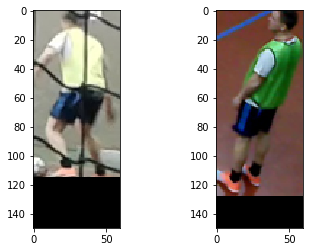

[0.99261165]


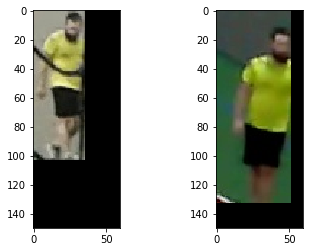

[0.9992349]


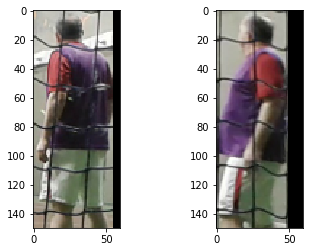

[0.99794114]


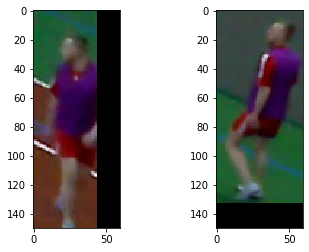

[0.9968286]


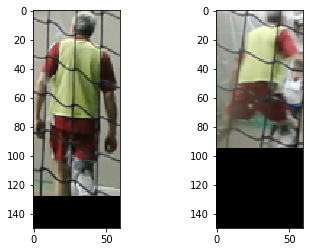

[0.99902123]


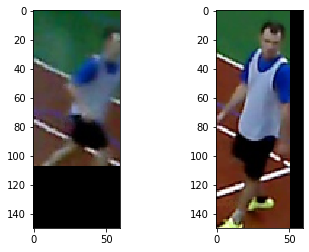

[0.9936204]


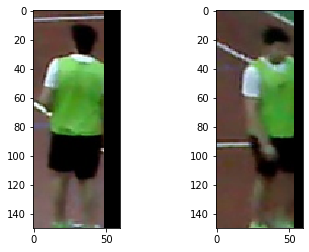

[0.9924273]


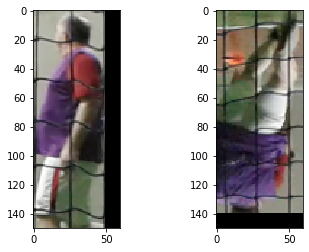

[0.9998525]


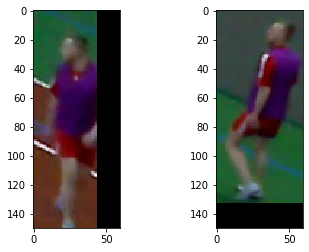

[0.9968286]


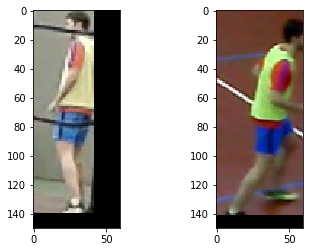

[0.9902543]


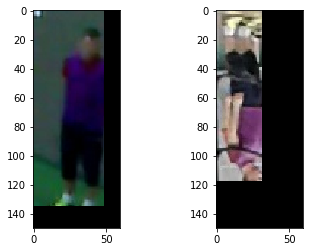

[0.9952065]


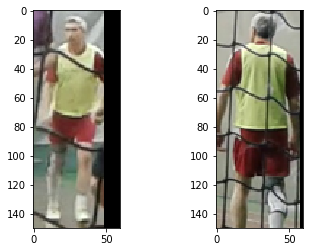

[0.998155]


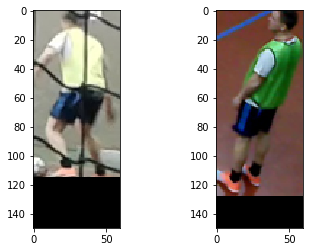

[0.99261165]


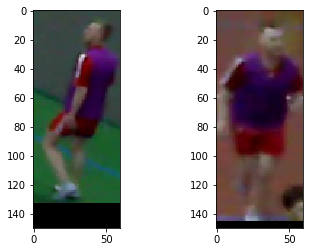

[0.9949248]


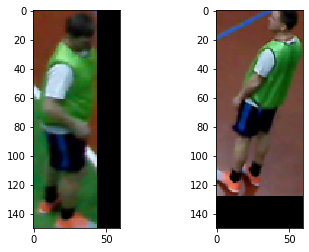

[0.9976645]


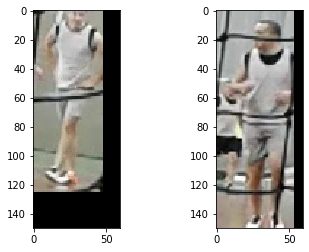

[0.9958944]


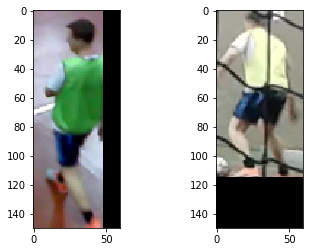

[0.99882233]


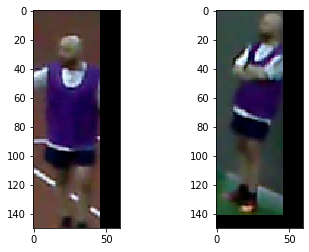

[0.99669266]


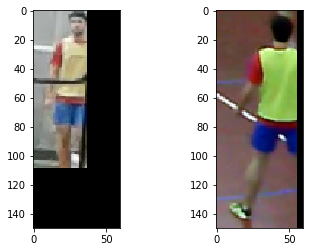

[0.99961805]


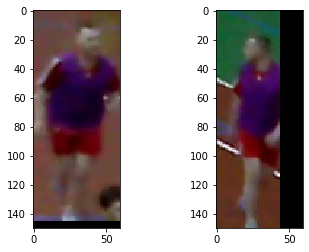

[0.99010825]


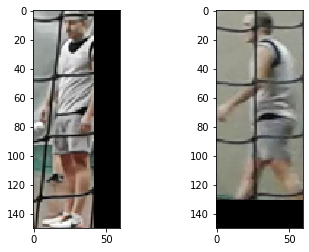

[0.9948199]


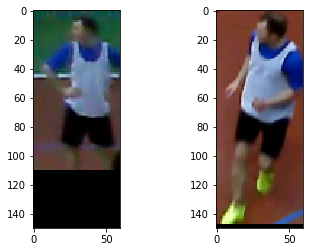

[0.99921966]


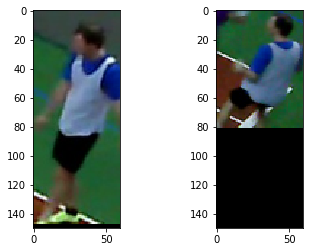

[0.99950397]


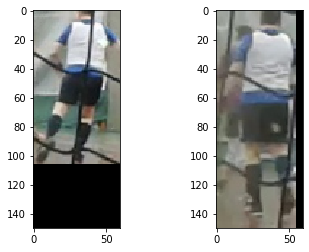

[0.99908817]


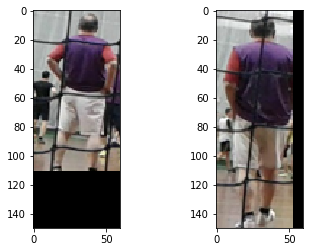

[0.9995366]


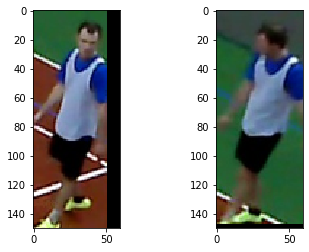

[0.99743396]


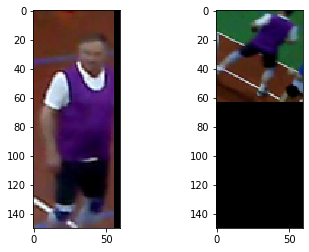

[0.99146825]


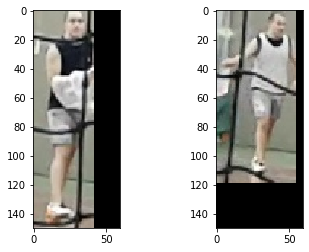

[0.99975353]


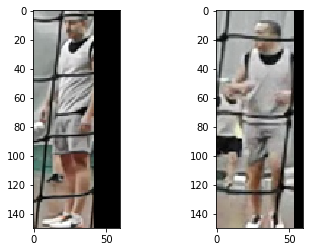

[0.99984634]


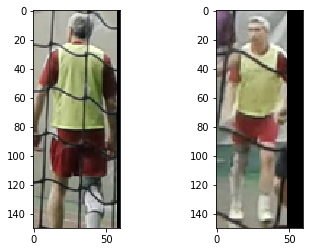

[0.998155]


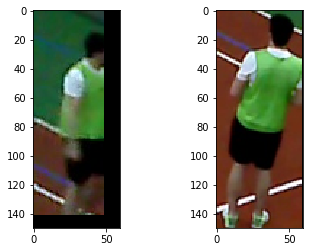

[0.99510455]


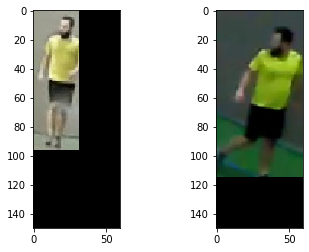

[0.9969898]


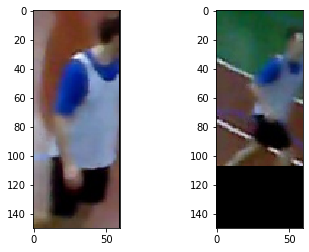

[0.99960256]


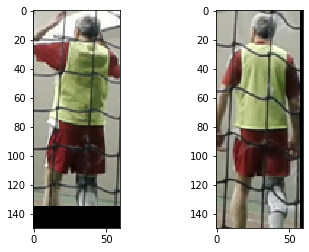

[0.999444]


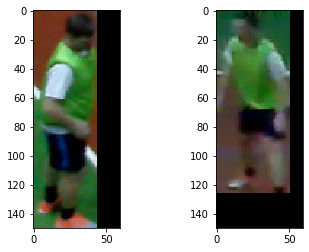

[0.9965216]


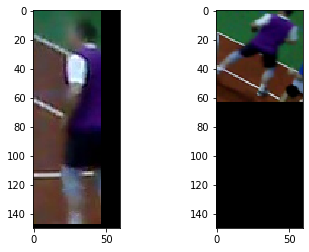

[0.993821]


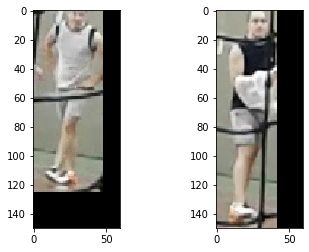

[0.9969182]


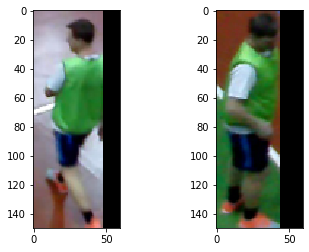

[0.99504757]


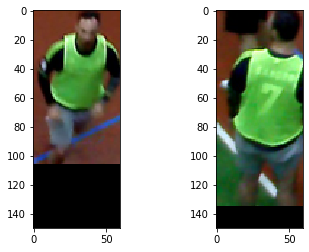

[0.9970441]


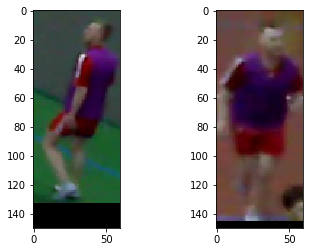

[0.9949248]


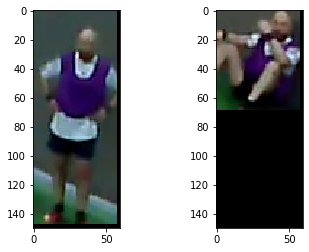

[0.99813175]


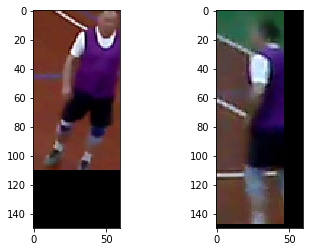

[0.9933044]


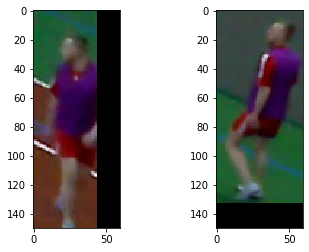

[0.9968286]


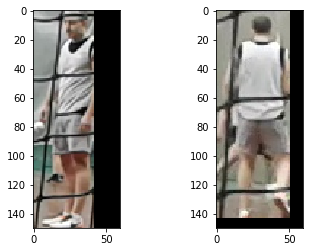

[0.9997821]


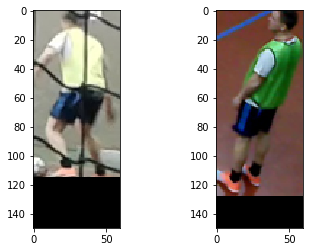

[0.99261165]


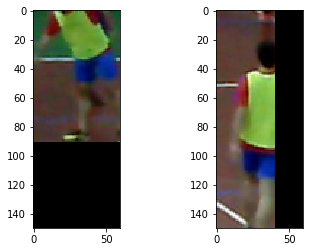

[0.9991816]


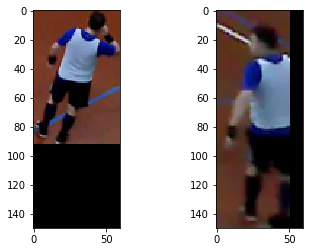

[0.995902]


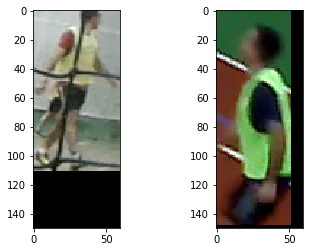

[0.9997512]


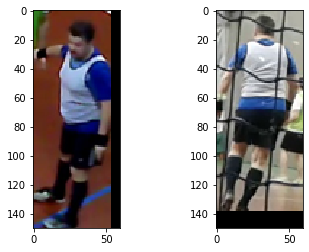

[0.9996414]


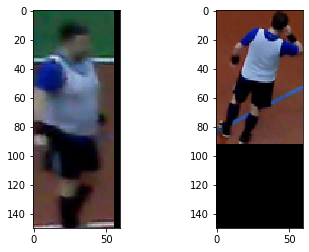

[0.9999459]


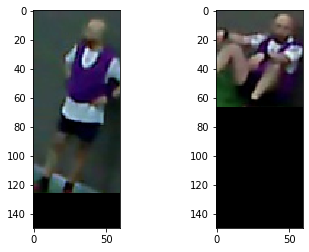

[0.99463606]


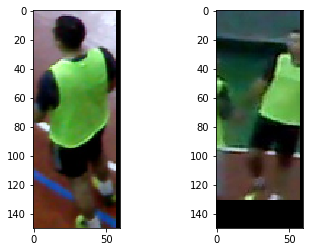

[0.9997257]


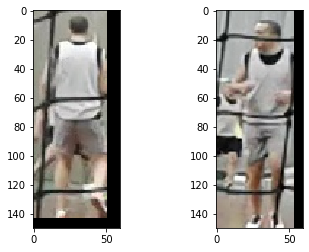

[0.9976729]


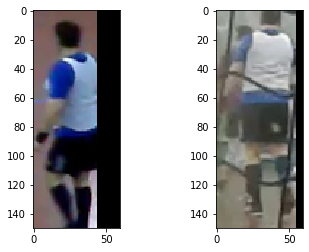

[0.9995128]


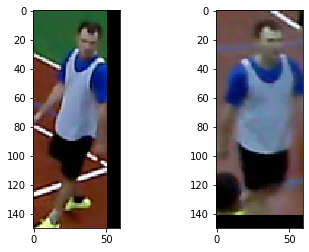

[0.9976444]


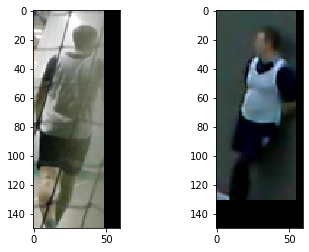

[0.99617124]


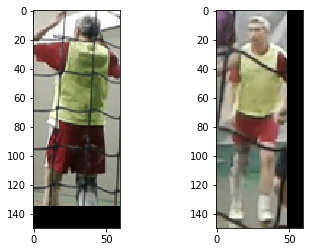

[0.99951553]


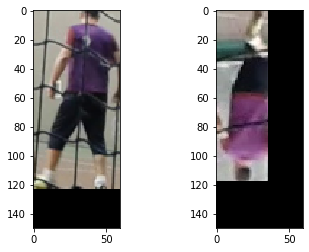

[0.9970938]


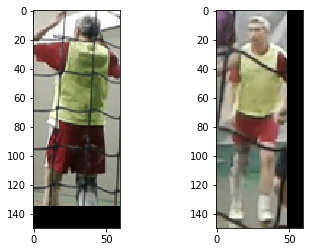

[0.99951553]


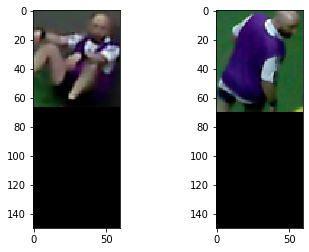

[0.99190885]


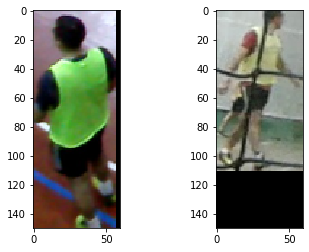

[0.9999695]


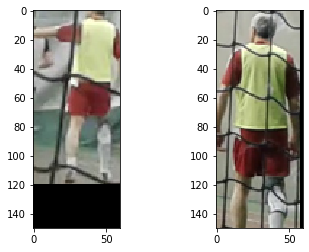

[0.999979]


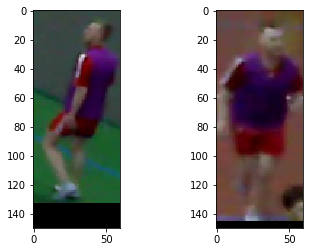

[0.9949248]


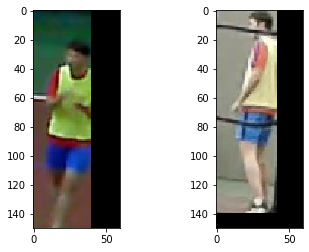

[0.9947281]


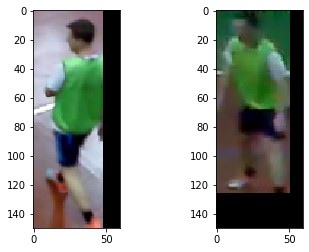

[0.99597836]


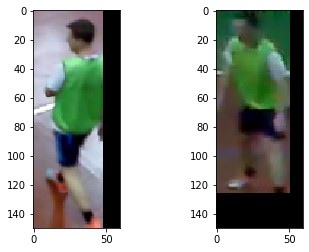

[0.99597836]


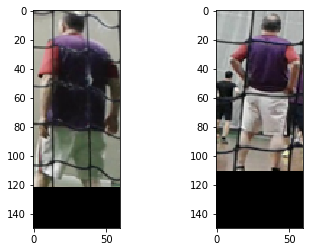

[0.99629134]


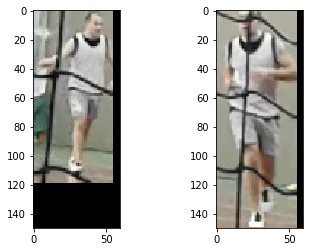

[0.99956]


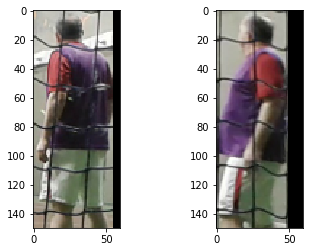

[0.99794114]


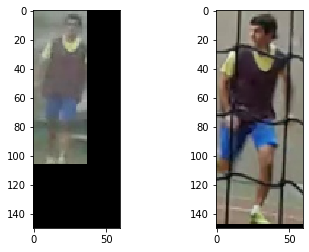

[0.9977489]


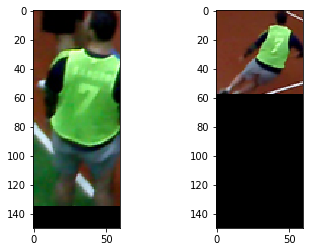

[0.99830693]


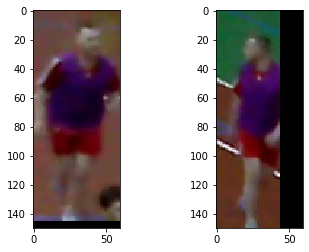

[0.99010825]


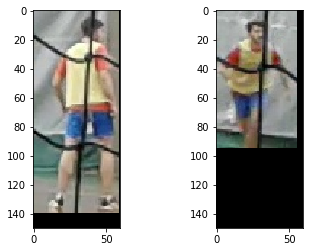

[0.99079275]


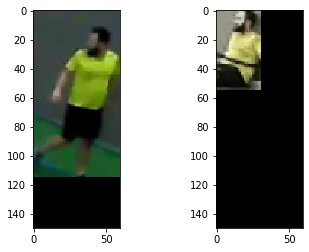

[0.99738574]


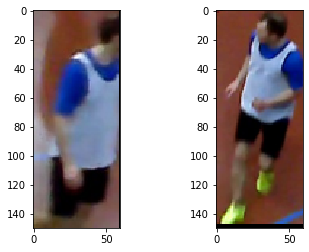

[0.998335]


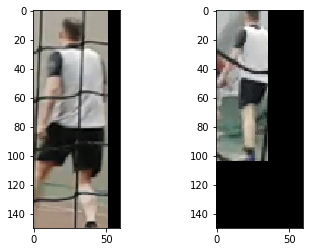

[0.9980706]


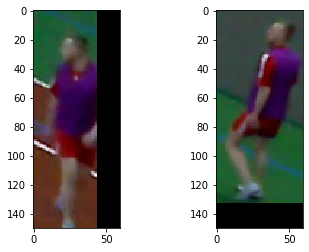

[0.9968286]


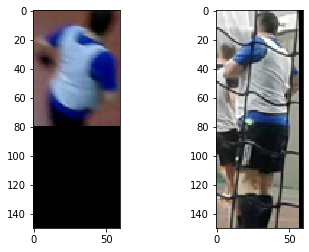

[0.9996755]


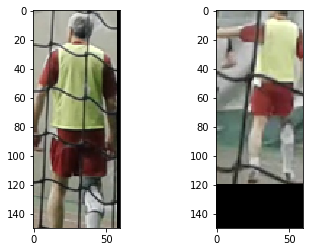

[0.999979]


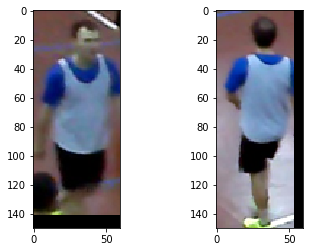

[0.9985466]


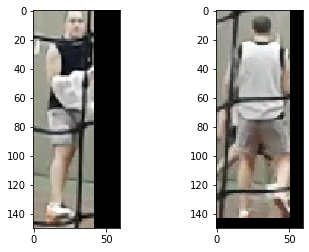

[0.9944761]


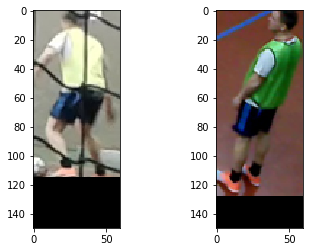

[0.99261165]


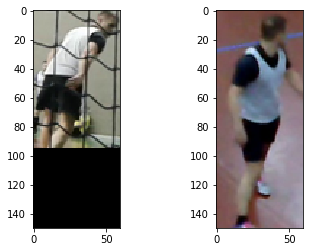

[0.99851227]


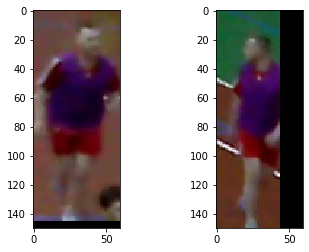

[0.99010825]


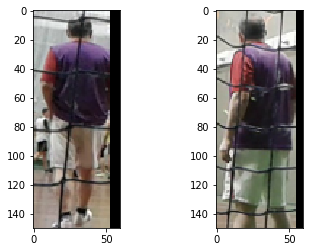

[0.99639857]


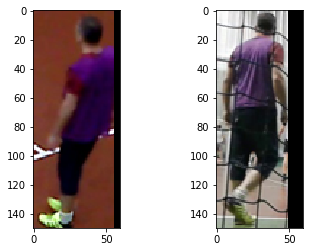

[0.9905529]


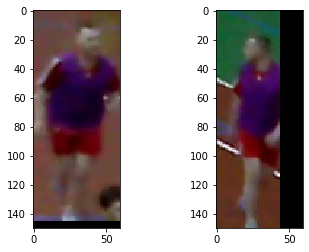

[0.99010825]


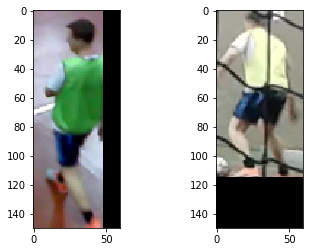

[0.99882233]


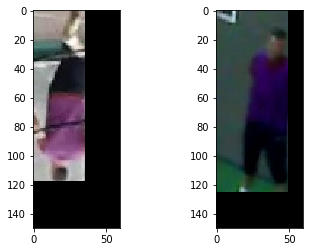

[0.9980513]


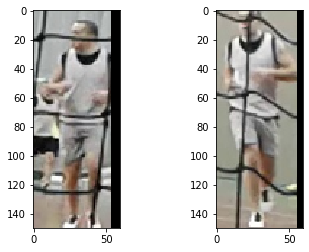

[0.9917458]


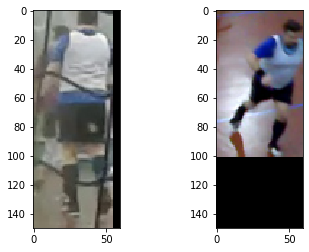

[0.9990592]


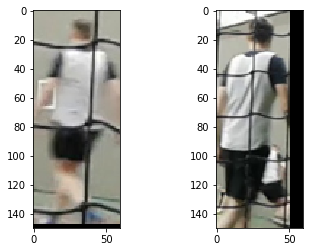

[0.9927987]


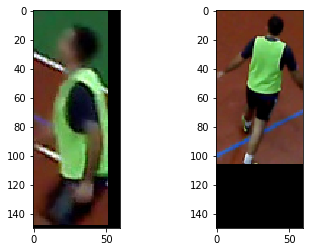

[0.9986377]


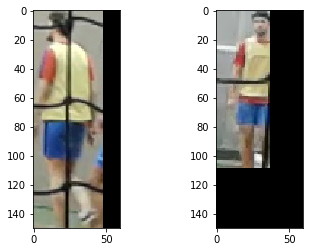

[0.99431825]


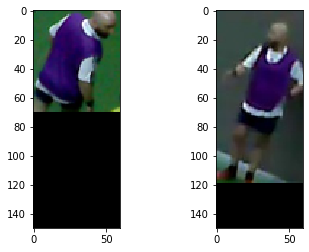

[0.99593186]


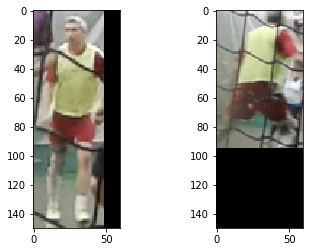

[0.9915503]


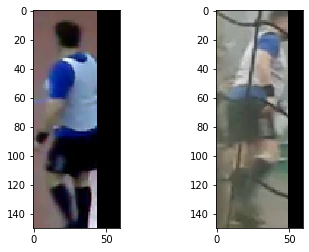

[0.9979267]


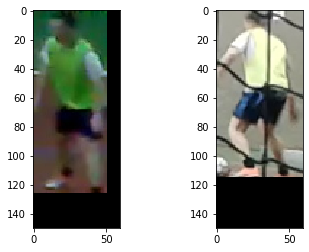

[0.9987874]


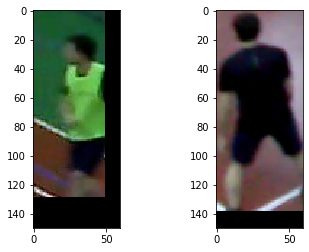

[0.9956462]


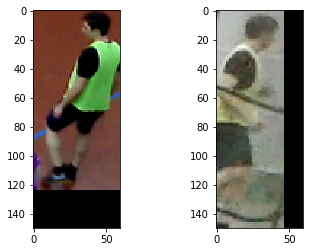

[0.9929582]


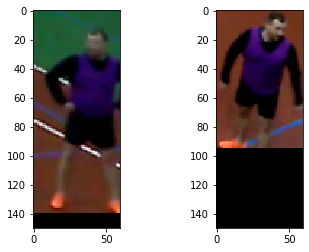

[0.9945102]


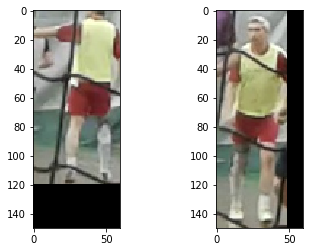

[0.99997103]


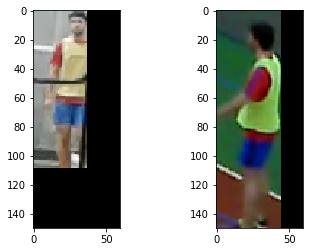

[0.99298596]


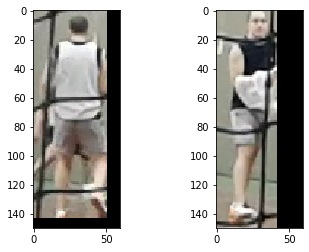

[0.9944761]


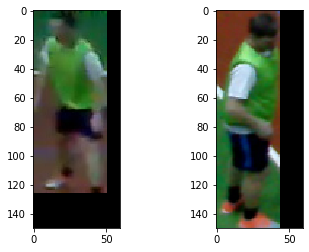

[0.9965216]


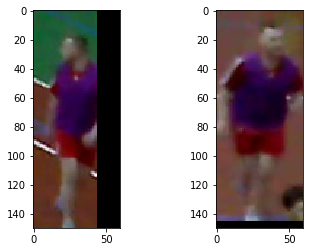

[0.99010825]


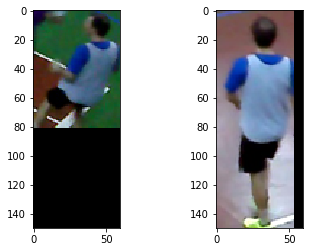

[0.9999957]


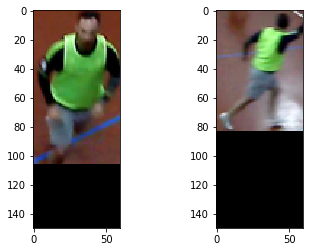

[0.994872]


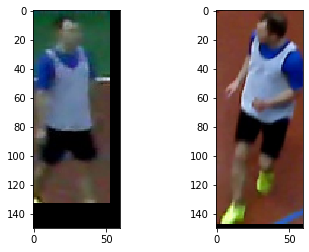

[0.99967]


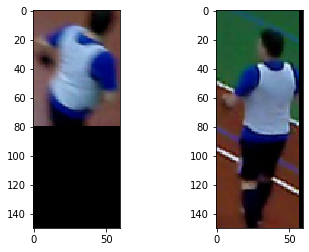

[0.9998554]


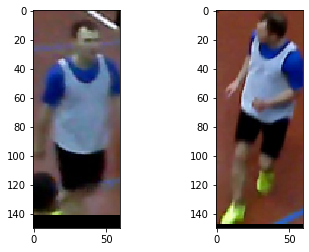

[0.99754393]


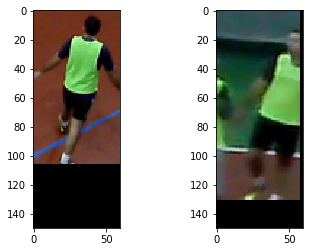

[0.9998617]


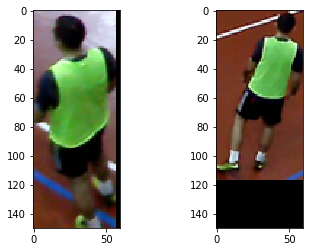

[0.99975437]


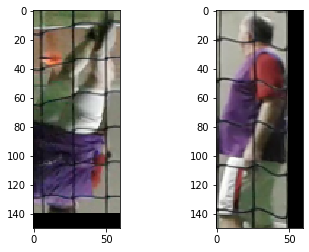

[0.9998525]


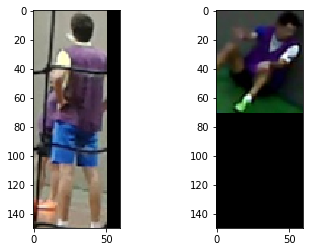

[0.9912443]


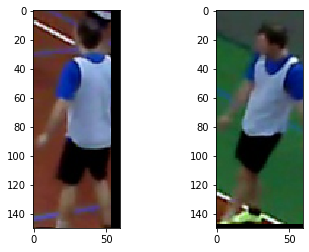

[0.99903786]


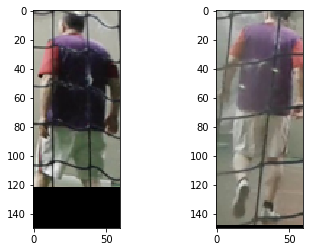

[0.9936279]


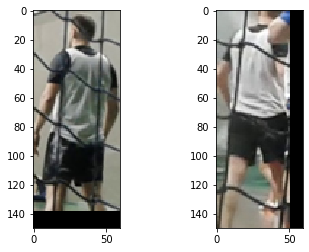

[0.99847716]


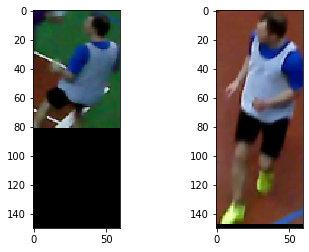

[0.99440354]


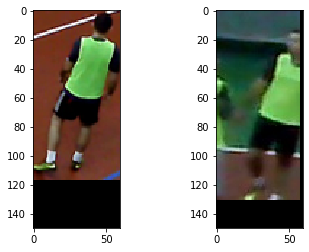

[0.9907372]


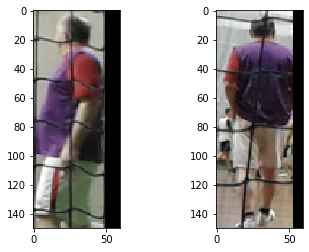

[0.9955547]


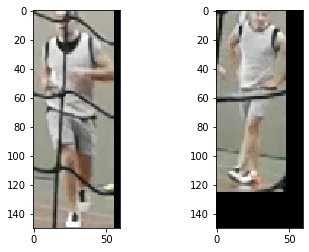

[0.99868023]


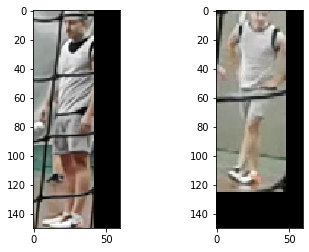

[0.9963571]


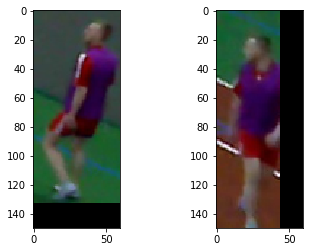

[0.9968286]


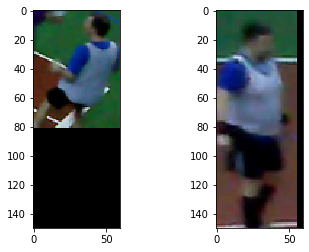

[0.9998747]


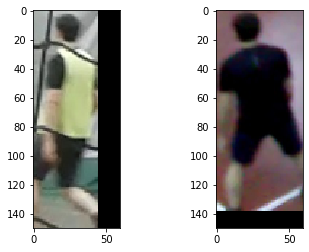

[0.9907203]


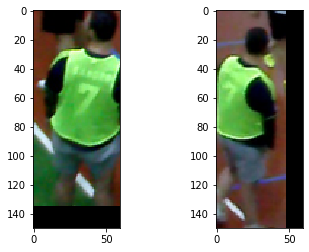

[0.9936866]


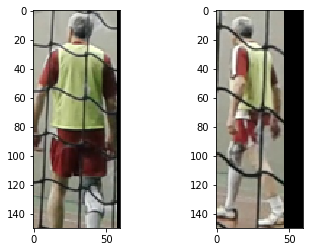

[0.9997201]


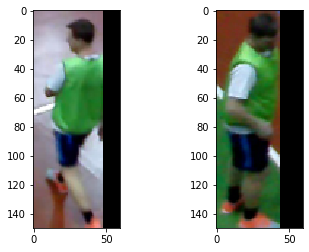

[0.99504757]


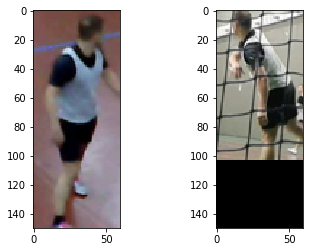

[0.9986594]


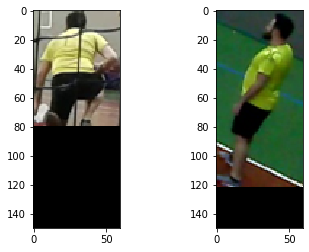

[0.99889857]


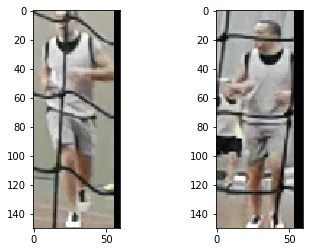

[0.9917458]


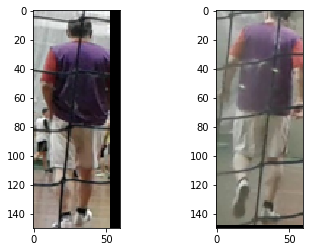

[0.9954037]


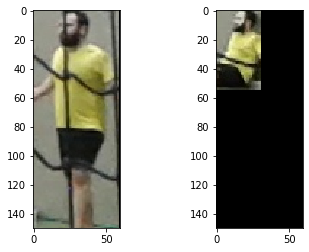

[0.99705136]


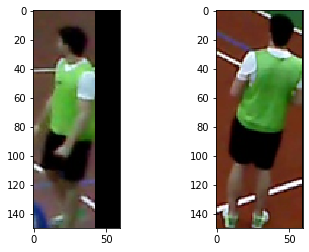

[0.999889]


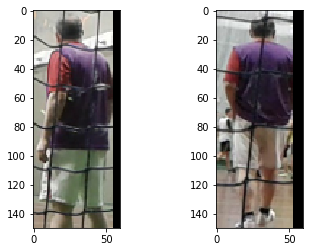

[0.99639857]


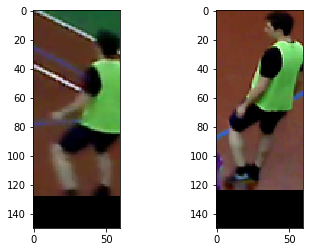

[0.9943731]


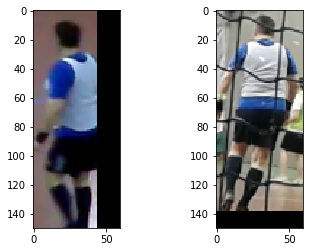

[0.99754333]


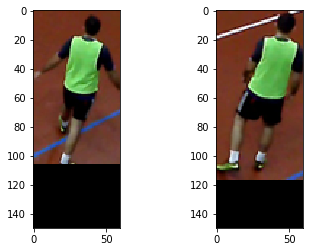

[0.998451]


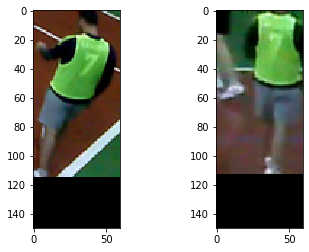

[0.9914353]


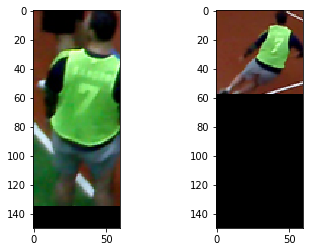

[0.99830693]


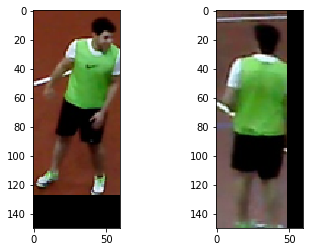

[0.9947367]


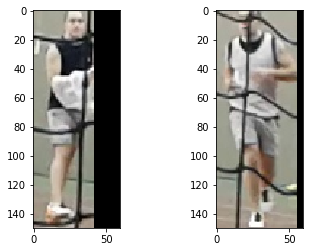

[0.9996333]


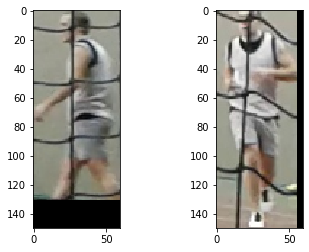

[0.9959306]


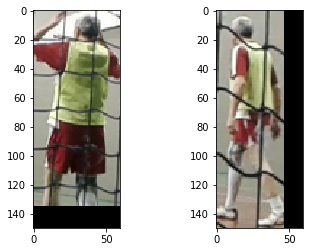

[0.9978601]


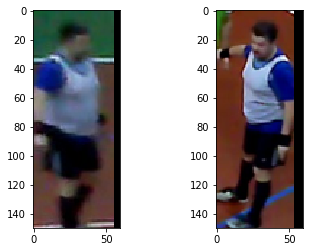

[0.9999148]


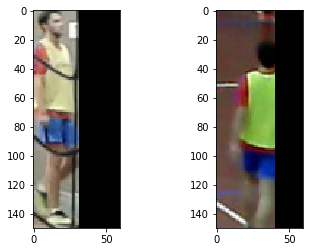

[0.9987196]


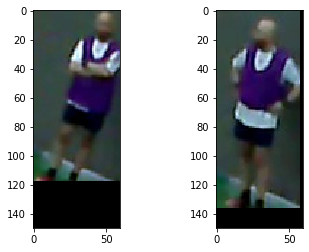

[0.9949028]


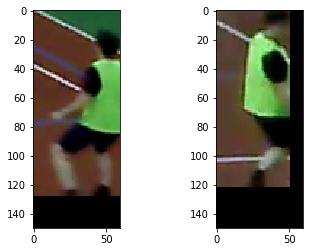

[0.99365795]


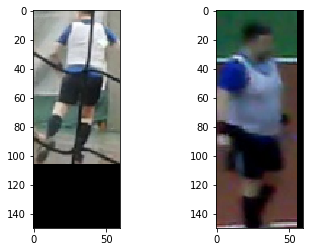

[0.99993056]


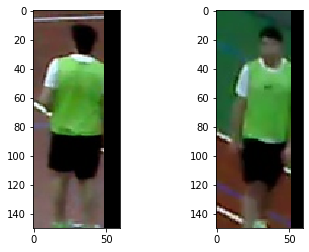

[0.9990096]


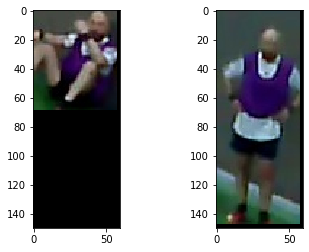

[0.99813175]


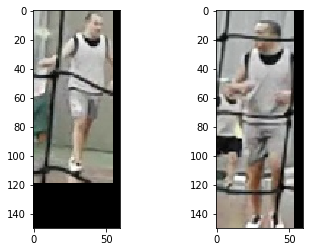

[0.9989604]


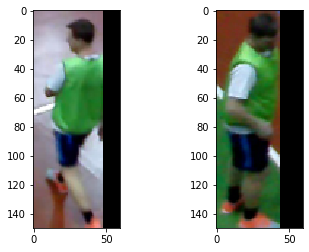

[0.99504757]


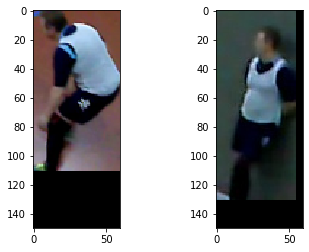

[0.9920542]


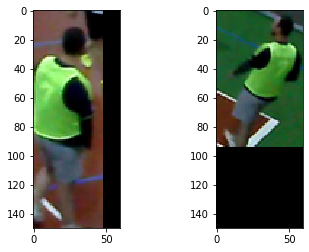

[0.9974755]


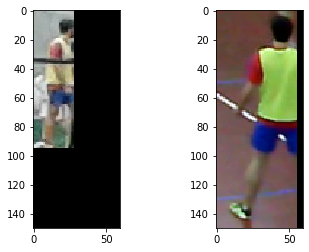

[0.9930483]


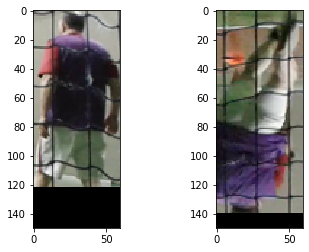

[0.9994567]


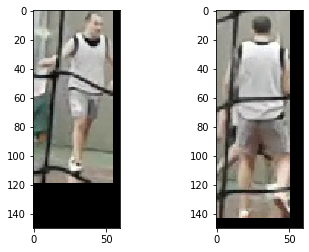

[0.9999498]


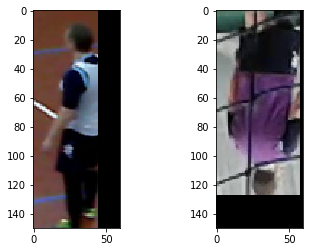

[0.99349225]


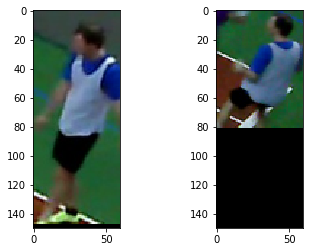

[0.99950397]


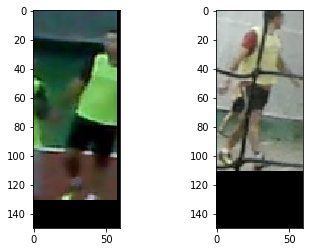

[0.9984192]


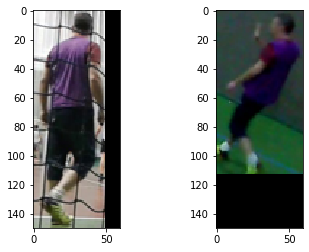

[0.99854237]


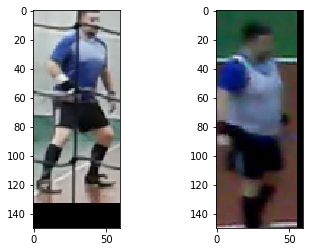

[0.9999032]


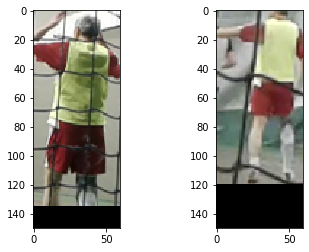

[0.99923366]


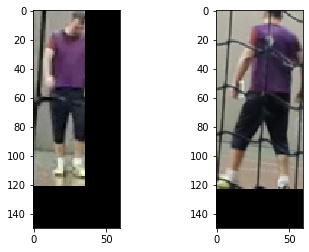

[0.99357957]


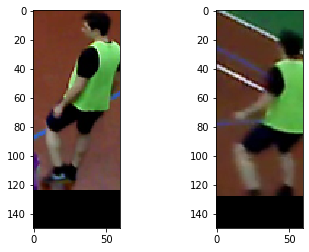

[0.9943731]


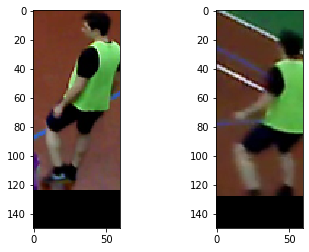

[0.9943731]


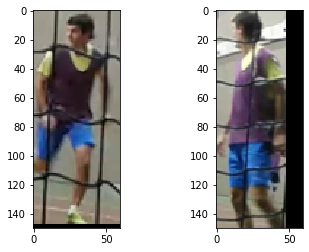

[0.99453235]


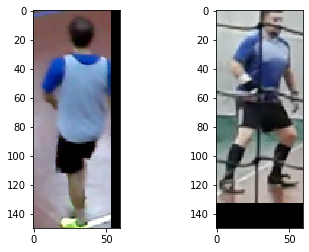

[0.99210215]


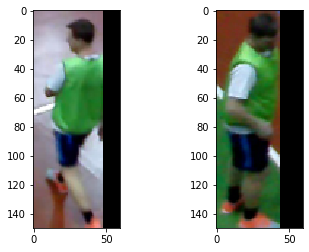

[0.99504757]


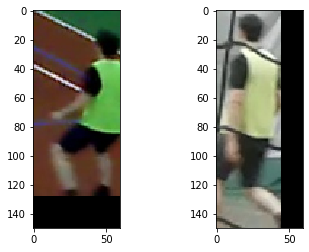

[0.99301386]


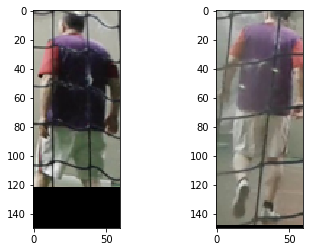

[0.9936279]


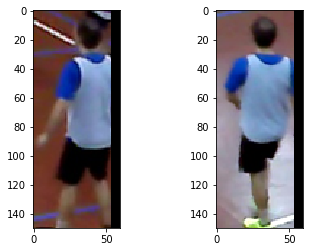

[0.9944626]


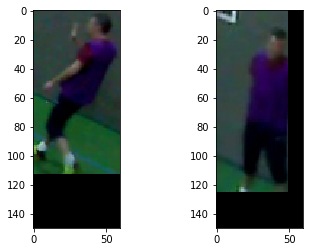

[0.9960774]


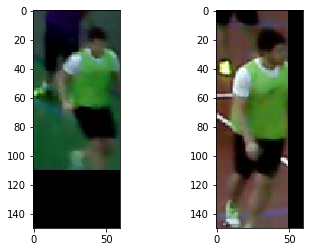

[0.9988296]


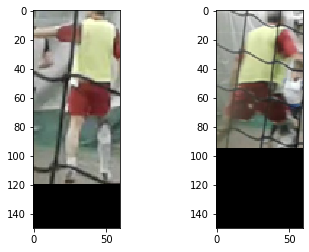

[0.99968374]


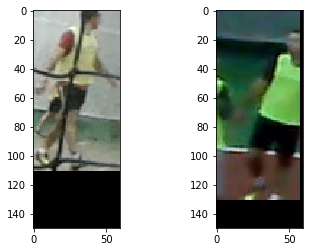

[0.9984192]


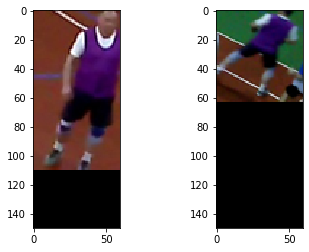

[0.9982321]


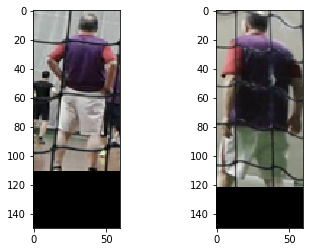

[0.99629134]


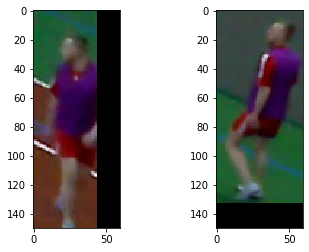

[0.9968286]


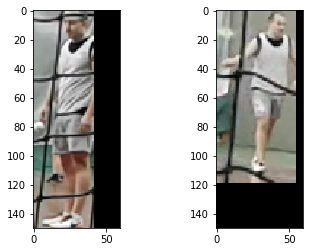

[0.99999154]


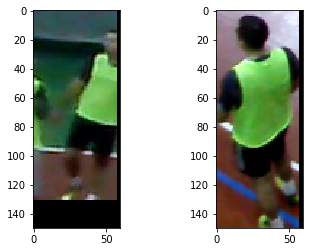

[0.9997257]


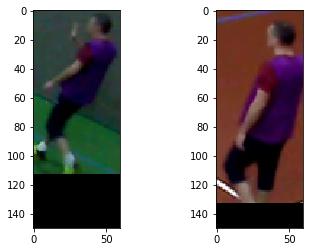

[0.99248064]


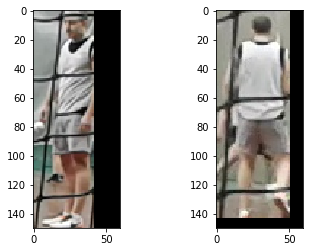

[0.9997821]


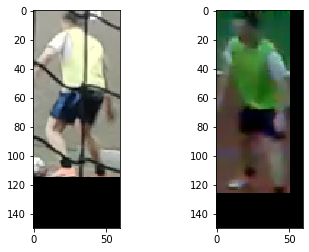

[0.9987874]


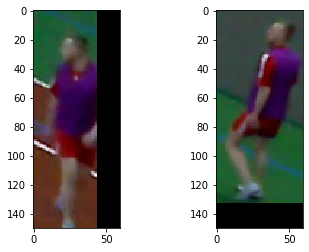

[0.9968286]


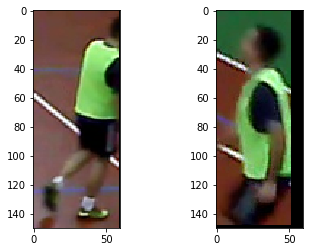

[0.9986277]


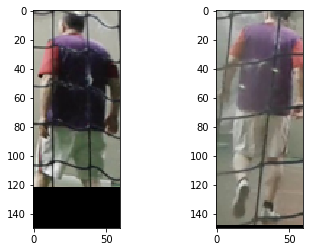

[0.9936279]


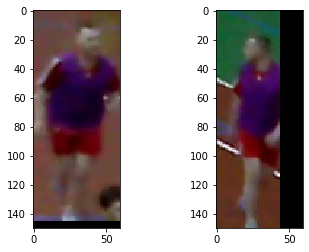

[0.99010825]


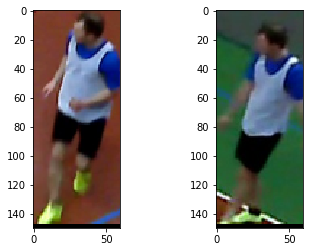

[0.9951476]


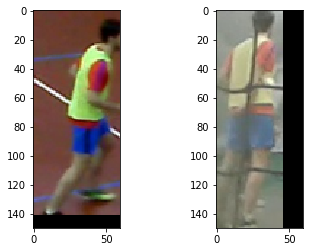

[0.9944201]


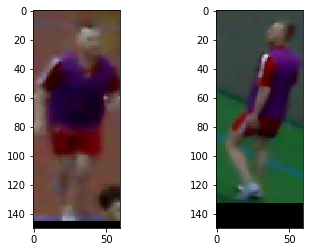

[0.9949248]


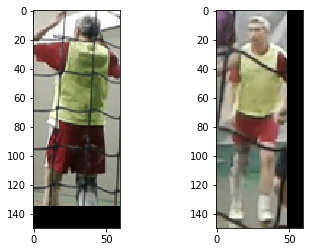

[0.99951553]


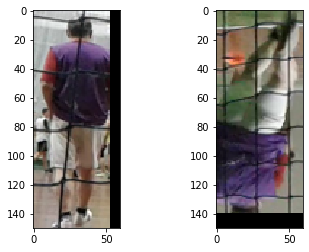

[0.99997944]


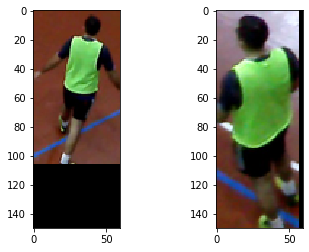

[0.99157155]


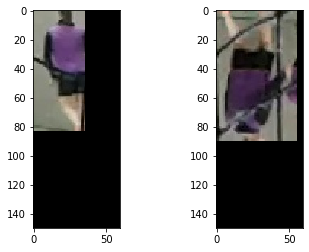

[0.99851793]


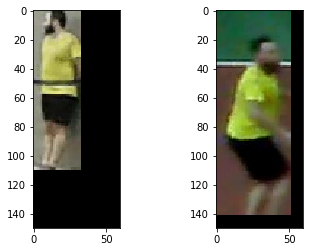

[0.99532044]


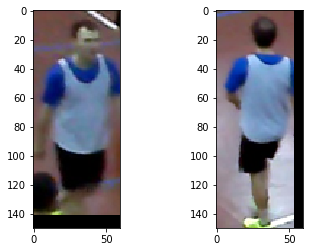

[0.9985466]


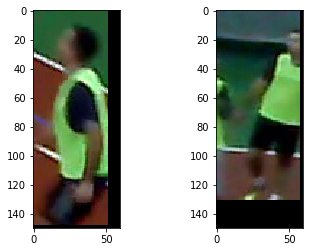

[0.9999882]


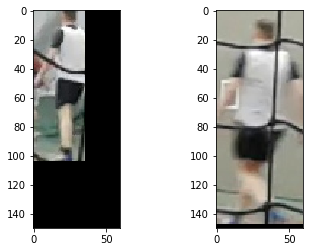

[0.99920774]


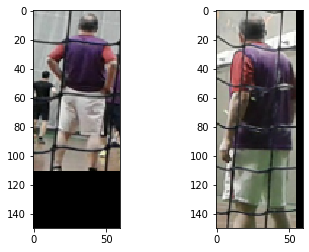

[0.99968827]


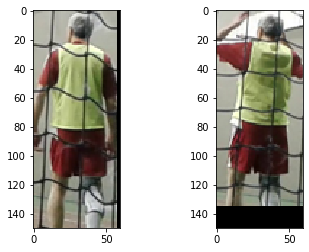

[0.999444]


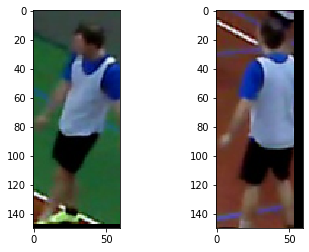

[0.99903786]


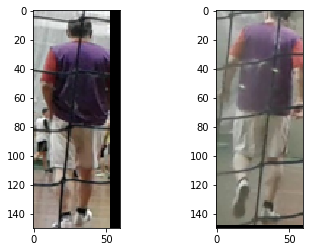

[0.9954037]


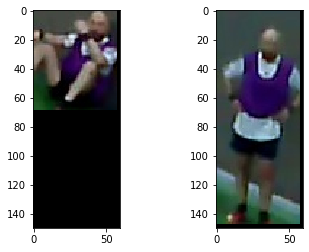

[0.99813175]


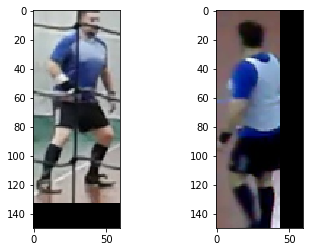

[0.9995362]


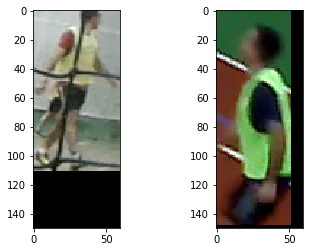

[0.9997512]


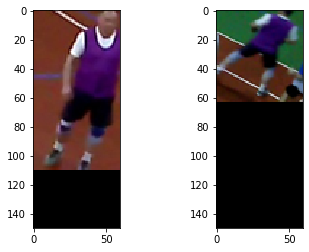

[0.9982321]


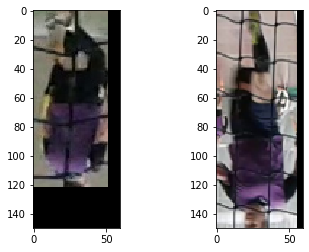

[0.9991803]


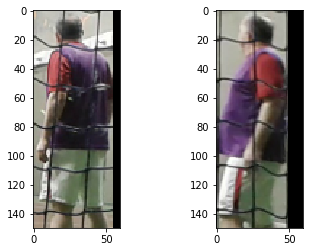

[0.9979412]


In [68]:
from matplotlib import pyplot as plt
for n in range(len(x_test)): 
    if pred[n][0] > 0.99:
        im1, im2 = (x_test[n,0], x_test[n,1])
        fig, (ax1, ax2) = plt.subplots(1, 2)
        #fig.suptitle('Horizontally stacked subplots')
        #ax1.plot(x, y)
        #ax2.plot(x, -y)

        ax1.imshow(im1, interpolation='nearest')
        #plt.show()
        ax2.imshow(im2, interpolation='nearest')
        plt.show()
        print(pred[n])


In [209]:
max_thumb_size = (60, 150)
class ImageStandardizer:
    def __init__(self, max_thumb_size):
        self.max_thumb_size = max_thumb_size
    def process_from_file(self, filepath):
        from PIL import Image
        import numpy as np
        with Image.open(filepath) as image:
            blank_image = Image.new('RGB', self.max_thumb_size, 'black')
            image.thumbnail(self.max_thumb_size, Image.BICUBIC)
            blank_image.paste(image, (0,0)) # add to left upper corner
            return np.asarray(blank_image), blank_image
    def save_to_image_file(self, image, output_image_path):
        image.save(output_image_path)        
imageStandardarizer = ImageStandardizer(max_thumb_size)        

In [212]:
import glob
images = [f for f in glob.glob(path + "* _*/*.jpg", recursive=True)]

In [75]:
from PIL import Image
import numpy as np    
class ImageStandardizer:
 
    def __init__(self, max_thumb_size):
        self.max_thumb_size = max_thumb_size
    def array_from_file(self, filepath):

        with Image.open(filepath) as image:
            blank_image = Image.new('RGB', self.max_thumb_size, 'black')
            image.thumbnail(self.max_thumb_size, Image.BICUBIC)
            blank_image.paste(image, (0,0)) # add to left upper corner
            return np.asarray(blank_image)
    def array_from_file_list(self, filepaths):
        res=[]
        for filepath in filepaths:
            with Image.open(filepath) as image:
                blank_image = Image.new('RGB', self.max_thumb_size, 'black')
                image.thumbnail(self.max_thumb_size, Image.BICUBIC)
                blank_image.paste(image, (0,0)) # add to left upper corner
                res.append(np.asarray(blank_image))
        return np.asarray(res)
            
            
    def save_to_image_file(self, image, output_image_path):
        image.save(output_image_path)        

In [90]:
path

'd:\\\\ML\\\\data\\\\f\\\\images\\\\out\\\\'

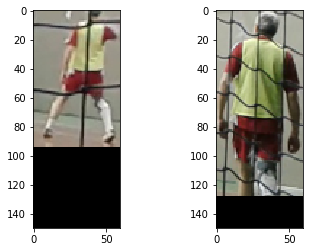

d:\\ML\\data\\f\\images\\out\\13609ea4bc5d40e690fbdd164a5159d0.jpg
0.057338662


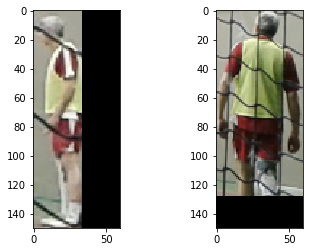

d:\\ML\\data\\f\\images\\out\\376efcdb00f5481b893720c7794b3ad0.jpg
0.011962615


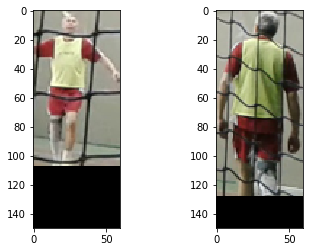

d:\\ML\\data\\f\\images\\out\\592c062aa39545ba8bda235e7a438026.jpg
0.13281392


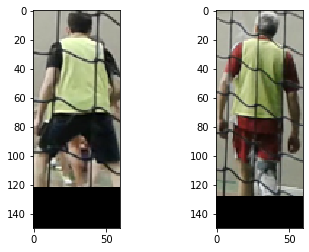

d:\\ML\\data\\f\\images\\out\\cdbbdd1ca561415ab0665644c00205df.jpg
0.07423745


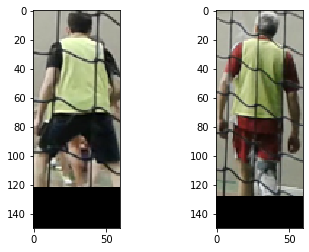

d:\\ML\\data\\f\\images\\out\\cdbbdd1ca561415ab0665644c00205df.jpg
0.07423745


In [128]:
max_thumb_size = (60, 150)
imageStandardizer = ImageStandardizer(max_thumb_size)
path=r'd:\\ML\\data\\f\\images\\out\\'
images = [f.path for f in os.scandir(os.path.join(path)) if f.is_file()]
n=100
#im1 = imageStandardizer.array_from_file(path+'2292edaacbff41069478ebe31f35b695.jpg')
im2 = imageStandardizer.array_from_file(path + r'Виталий Притулин _10\\'+ 'd1eb04af649a4b7b947d04b2b5d51043.jpg')  
rand_pairs = np.random.choice(images, (n,2))
for rand_pair in rand_pairs:
    im1 = imageStandardizer.array_from_file(rand_pair[0])
    
    #im2 = imageStandardizer.array_from_file(rand_pair[1])   
    pred = model2.predict([[im1/255], [im2/255]])
    if pred[0][0] > 0.01:
        fig, (ax1, ax2) = plt.subplots(1, 2)
        ax1.imshow(im1, interpolation='nearest')
        ax2.imshow(im2, interpolation='nearest')
        plt.show() 
        print(rand_pair[0])
        print(pred[0][0])

In [218]:
from tensorflow.python.keras import models , optimizers , losses ,activations , callbacks
from tensorflow.python.keras.layers import *
import tensorflow.python.keras.backend as K
from PIL import Image
import tensorflow as tf
import time
import os
import numpy as np

class Recognizer (object) :

    def __init__( self ):

        tf.logging.set_verbosity( tf.logging.ERROR )

        self.__DIMEN = 128

        input_shape = ( (self.__DIMEN**2) * 3 , )
        convolution_shape = ( self.__DIMEN , self.__DIMEN , 3 )
        kernel_size_1 = ( 4 , 4 )
        kernel_size_2 = ( 3 , 3 )
        pool_size_1 = ( 3 , 3 )
        pool_size_2 = ( 2 , 2 )
        strides = 1

        seq_conv_model = [

            Reshape( input_shape=input_shape , target_shape=convolution_shape),

            Conv2D( 32, kernel_size=kernel_size_1 , strides=strides , activation=activations.leaky_relu ),
            Conv2D( 32, kernel_size=kernel_size_1, strides=strides, activation=activations.leaky_relu),
            MaxPooling2D(pool_size=pool_size_1, strides=strides ),

            Conv2D( 64, kernel_size=kernel_size_2 , strides=strides , activation=activations.leaky_relu ),
            Conv2D( 64, kernel_size=kernel_size_2 , strides=strides , activation=activations.leaky_relu ),
            MaxPooling2D(pool_size=pool_size_2 , strides=strides),

            Flatten(),

            Dense( 64 , activation=activations.sigmoid )

        ]

        seq_model = tf.keras.Sequential( seq_conv_model )

        input_x1 = Input( shape=input_shape )
        input_x2 = Input( shape=input_shape )

        output_x1 = seq_model( input_x1 )
        output_x2 = seq_model( input_x2 )

        distance_euclid = Lambda( lambda tensors : K.abs( tensors[0] - tensors[1] ))( [output_x1 , output_x2] )
        outputs = Dense( 1 , activation=activations.sigmoid) ( distance_euclid )
        self.__model = models.Model( [ input_x1 , input_x2 ] , outputs )

        self.__model.compile( loss=losses.binary_crossentropy , optimizer=optimizers.Adam(lr=0.0001))



    def fit(self, X, Y ,  hyperparameters  ):
        initial_time = time.time()
        self.__model.fit( X  , Y ,
                         batch_size=hyperparameters[ 'batch_size' ] ,
                         epochs=hyperparameters[ 'epochs' ] ,
                         callbacks=hyperparameters[ 'callbacks'],
                         validation_data=hyperparameters[ 'val_data' ]
                         )
        final_time = time.time()
        eta = ( final_time - initial_time )
        time_unit = 'seconds'
        if eta >= 60 :
            eta = eta / 60
            time_unit = 'minutes'
        self.__model.summary( )
        print( 'Elapsed time acquired for {} epoch(s) -> {} {}'.format( hyperparameters[ 'epochs' ] , eta , time_unit ) )


    def prepare_images_from_dir( self , dir_path , flatten=True ) :
        images = list()
        images_names = os.listdir( dir_path )
        for imageName in images_names :
            image = Image.open(dir_path + imageName)
            resize_image = image.resize((self.__DIMEN, self.__DIMEN))
            array = list()
            for x in range(self.__DIMEN):
                sub_array = list()
                for y in range(self.__DIMEN):
                    sub_array.append(resize_image.load()[x, y])
                array.append(sub_array)
            image_data = np.array(array)
            image = np.array(np.reshape(image_data,(self.__DIMEN, self.__DIMEN, 3)))
            images.append(image)

        if flatten :
            images = np.array(images)
            return images.reshape( ( images.shape[0]  , self.__DIMEN**2 * 3  ) ).astype( np.float32 )
        else:
            return np.array(images)



    def evaluate(self , test_X , test_Y  ) :
        return self.__model.evaluate(test_X, test_Y)


    def predict(self, X  ):
        predictions = self.__model.predict( X  )
        return predictions


    def summary(self):
        self.__model.summary()

    def save_model(self , file_path ):
        self.__model.save(file_path )


    def load_model(self , file_path ):
        self.__model = models.load_model(file_path)

TabError: inconsistent use of tabs and spaces in indentation (<ipython-input-218-ee7409690308>, line 15)

In [76]:
np.random.randint(5)

0

In [63]:
np.random.choice(8, 2)

array([0, 0])

In [42]:
sub_dirs

['Акоп _36',
 'Александр Кулявцев _12',
 'Алихан Абдулаев _5',
 'Валера _44',
 'Виталий Притулин _10',
 'Дмитрий Витвицкий _21',
 'Илья _22',
 'Максим Аникеев _33',
 'Михаил Невинный _38',
 'Шахин Абулов _4']

In [25]:
image_shape = (150, 60, 3)